In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import argparse as args
from argparse import ArgumentParser
import cv2
from google.colab.patches import cv2_imshow
import pathlib
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import os
from PIL import Image

# CLAHE

Text(0.5, 1.0, 'CLAHE')

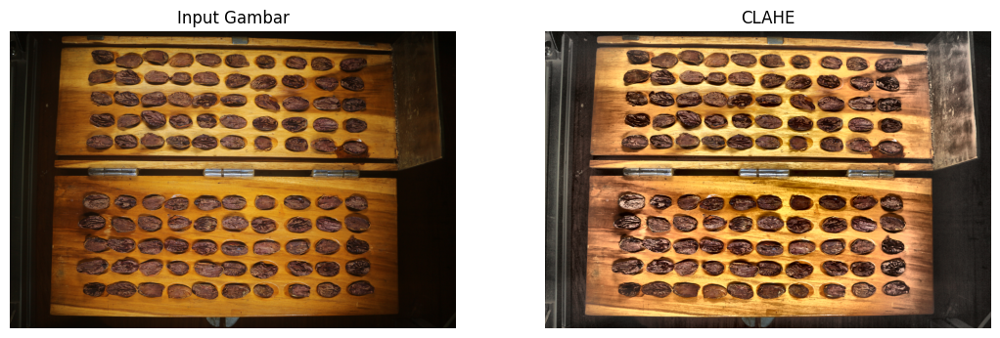

In [ ]:
img = cv2.imread("/content/drive/MyDrive/Kakao/data_gambar_2/47.JPG")

img_RGB = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img_Lab = cv2.cvtColor(img_RGB, cv2.COLOR_RGB2Lab)

clahe = cv2.createCLAHE(clipLimit=10,tileGridSize=(8,8)) #configure CLAHE
img_Lab[:,:,0] = clahe.apply(img_Lab[:,:,0]) #0 to 'L' channel, 1 to 'a' channel, and 2 to 'b' channel

result_CLAHE = cv2.cvtColor(img_Lab, cv2.COLOR_Lab2RGB)


# create figure
fig = plt.figure(figsize=(20, 10))
rows = 1
columns = 3

# Adds a subplot at the 1st position
fig.add_subplot(rows, columns, 1)

plt.imshow(img_RGB,'gray')
plt.axis('off')
plt.title("Input Gambar")

fig.add_subplot(rows, columns, 2)
plt.imshow(result_CLAHE,'gray')
plt.axis('off')
plt.title("CLAHE")

Running semua sampel citra

In [ ]:
import glob
import os
import cv2
import skimage
from PIL import Image

def apply_CLAHE(folder, sigma=1.0):
    # Memilih semua file yang ada pada folder dengan format .JPG
    sumber_gambar = glob.glob(folder + "/*.JPG")

    # Membuat folder baru di dalam folder dengan nama folder/hasil_otsu apabila folder belum ada
    # apabila sudah ada tidak akan membuat folder baru
    PATH = folder + "/hasil_CLAHE"
    if not os.path.exists(PATH):
      os.makedirs(PATH)

    for gambar in sumber_gambar:
      pathname, extension = os.path.splitext(gambar)
      # Untuk mendapatkan nama file
      filename = pathname.split('/')
      print(f"Processing {gambar}")

      img = cv2.imread(gambar)

      # convert the image

      img_RGB = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
      img_Lab = cv2.cvtColor(img_RGB, cv2.COLOR_RGB2Lab)

      clahe = cv2.createCLAHE(clipLimit=10,tileGridSize=(8,8)) #configure CLAHE
      img_Lab[:,:,0] = clahe.apply(img_Lab[:,:,0]) #0 to 'L' channel, 1 to 'a' channel, and 2 to 'b' channel

      result_CLAHE = cv2.cvtColor(img_Lab, cv2.COLOR_Lab2RGB)

      image = Image.fromarray(result_CLAHE) # n x m x 3

      image.save(PATH + "/" + filename[-1] + "_CLAHE" + ".jpg", "PNG")

In [ ]:
apply_CLAHE("/content/drive/MyDrive/Kakao/data_gambar_2")

# Crop Gambar

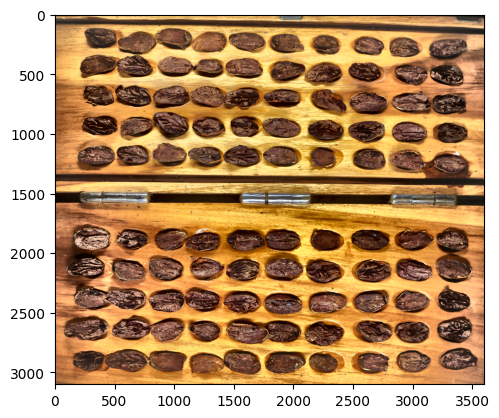

In [ ]:
img_ori = cv2.imread("/content/drive/MyDrive/Kakao/data_gambar_2/hasil_CLAHE/47_CLAHE.jpg")
#img_resize_crop_ori = img_ori[100:3200,800:4500]
img_resize_crop_ori = img_ori[100:3200,700:4300]
img_RGB_ori = cv2.cvtColor(img_resize_crop_ori, cv2.COLOR_BGR2RGB)
img_Lab_ori = cv2.cvtColor(img_resize_crop_ori, cv2.COLOR_RGB2Lab)

plt.imshow(img_RGB_ori,'gray')

Text(0.5, 1.0, 'Third')

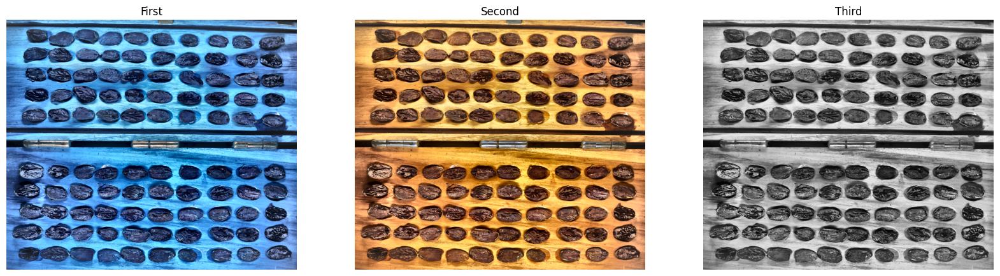

In [ ]:
img_RGB = cv2.cvtColor(img_resize_crop_ori, cv2.COLOR_BGR2RGB)  #Matplot lib expects img in RGB format but OpenCV provides it in BGR.
img_gray = cv2.cvtColor(img_resize_crop_ori, cv2.COLOR_BGR2GRAY)
img_Lab = cv2.cvtColor(img_resize_crop_ori, cv2.COLOR_RGB2Lab)

# create figure
fig = plt.figure(figsize=(20, 10))
rows = 1
columns = 3

# Adds a subplot at the 1st position
fig.add_subplot(rows, columns, 1)

plt.imshow(img_resize_crop_ori,'gray')
plt.axis('off')
plt.title("First")

fig.add_subplot(rows, columns, 2)
plt.imshow(img_RGB,'gray')
plt.axis('off')
plt.title("Second")

fig.add_subplot(rows, columns, 3)
plt.imshow(img_gray,'gray')
plt.axis('off')
plt.title("Third")

Text(0.5, 1.0, 'Inverse Threshold')

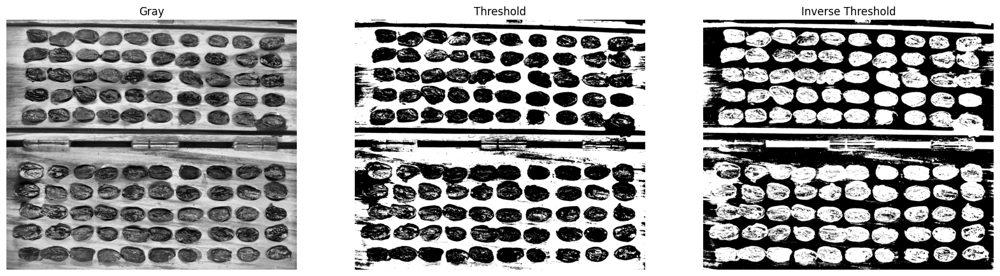

In [ ]:
th_val, img_th = cv2.threshold(img_gray,0,255,cv2.THRESH_BINARY + cv2.THRESH_OTSU)
# invert
img_th_inv = cv2.bitwise_not(img_th)

# create figure
fig = plt.figure(figsize=(20, 10))
rows = 1
columns = 3

# showing image
fig.add_subplot(rows, columns, 1)
plt.imshow(img_gray,'gray')
plt.axis('off')
plt.title("Gray")

fig.add_subplot(rows, columns, 2)
plt.imshow(img_th,'gray')
plt.axis('off')
plt.title("Threshold")

fig.add_subplot(rows, columns, 3)
plt.imshow(img_th_inv,'gray')
plt.axis('off')
plt.title("Inverse Threshold")

(3130, 3630)


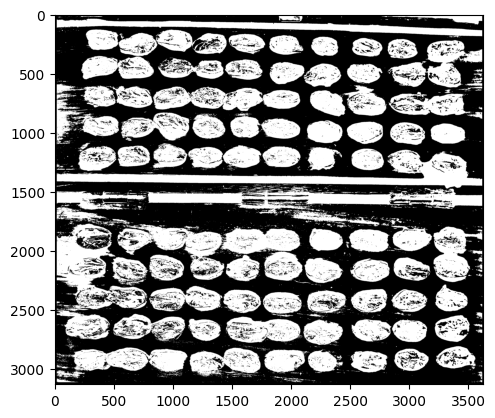

In [ ]:
# membuat border/garis tepi citra agar next proses cleaning nya berhasil
image_bordered = cv2.copyMakeBorder(src=img_th_inv, top=15, bottom=15, left=15, right=15, borderType=cv2.BORDER_CONSTANT)
plt.imshow (image_bordered, 'gray')
print(image_bordered.shape)

Text(0.5, 1.0, 'Output')

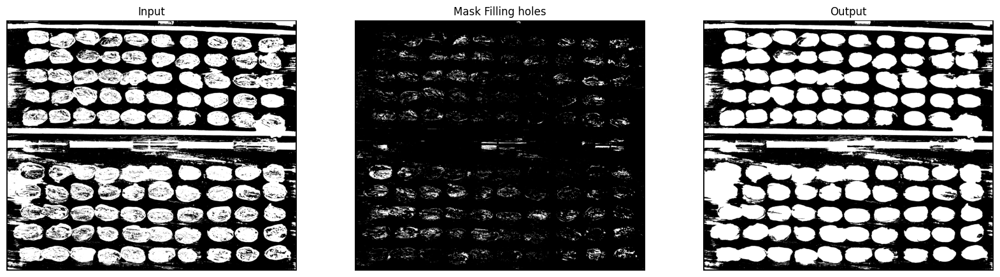

In [ ]:
# Cleaning citra
im_floodfill = image_bordered.copy()
h, w = image_bordered.shape[:2]
mask = np.zeros((h+2, w+2), np.uint8)
cv2.floodFill(im_floodfill, mask, (0,0), 255);
im_floodfill_inv = cv2.bitwise_not(im_floodfill)
im_out = image_bordered | im_floodfill_inv

# create figure
fig = plt.figure(figsize=(20, 10))
rows = 1
columns = 3

fig.add_subplot(rows, columns, 1)
plt.imshow(image_bordered,'gray')
plt.axis('off')
plt.title("Input")

fig.add_subplot(rows, columns, 2)
plt.imshow(im_floodfill_inv,'gray')
plt.axis('off')
plt.title("Mask Filling holes")

fig.add_subplot(rows, columns, 3)
plt.imshow(im_out,'gray')
plt.axis('off')
plt.title("Output")

Text(0.5, 1.0, 'Dilation (Kernel Dimensi 3 x 3)')

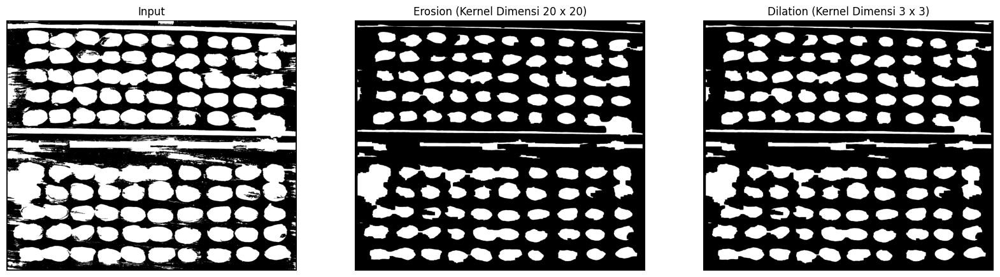

In [ ]:
# Operasi morfologi erosi dan dilasi
kernel1 = np.ones((20,20), np.uint8)
kernel2 = np.ones((3,3), np.uint8)
img_erosion0 = cv2.erode(im_out, kernel1, iterations=2)
img_dilation0 = cv2.dilate(img_erosion0, kernel2, iterations=2)

# create figure
fig = plt.figure(figsize=(20, 10))
rows = 1
columns = 3
fig.add_subplot(rows, columns, 1)

# showing image
plt.imshow(im_out,'gray')
plt.axis('off')
plt.title("Input")

fig.add_subplot(rows, columns, 2)
plt.imshow(img_erosion0,'gray')
plt.axis('off')
plt.title("Erosion (Kernel Dimensi 20 x 20)")

fig.add_subplot(rows, columns, 3)
plt.imshow(img_dilation0,'gray')
plt.axis('off')
plt.title("Dilation (Kernel Dimensi 3 x 3)")

(3100, 3600, 3)
(3130, 3630)
(3100, 3600)


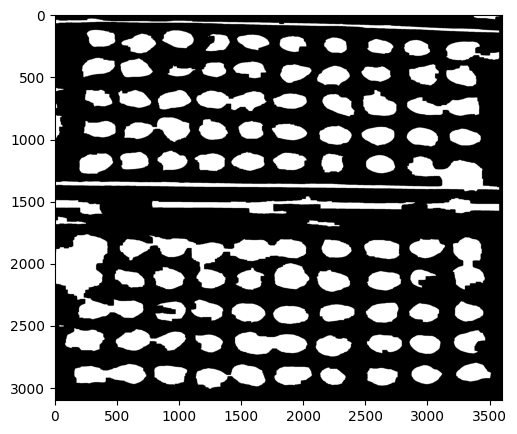

In [ ]:
# Citra di resize ke ukuran awal (sebelum dibuat border)

fig = plt.figure(figsize=(10, 5))
#img2_resize_crop = img_dilation0[30:3215,30:4515]
img2_resize_crop = img_dilation0[30:3215,30:4315]
plt.imshow(img2_resize_crop,'gray')

print(img_resize_crop_ori.shape) # print size citra input/original
print(image_bordered.shape) # print size citra yang sudah dibuat border
print(img2_resize_crop.shape) # print hasil resize pada coding ini

Text(0.5, 1.0, 'Second')

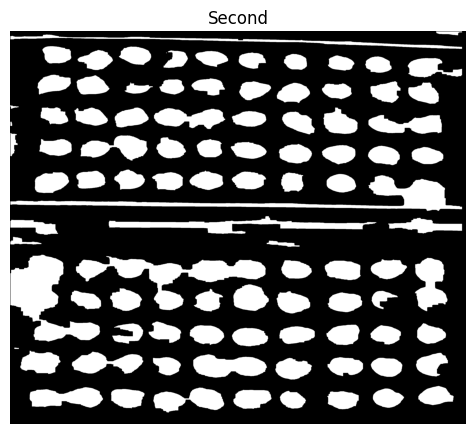

In [ ]:
# Remove undesirable element - part 1
pad = cv2.copyMakeBorder(img2_resize_crop, 1,1,1,1, cv2.BORDER_CONSTANT, value=255)
h, w = pad.shape
mask = np.zeros([h + 2, w + 2], np.uint8)
img_floodfill = cv2.floodFill(pad, mask, (0,0), 0, (5), (0), flags=8)[1]
img_floodfill = img_floodfill[1:h-1, 1:w-1]

# create figure
fig = plt.figure(figsize=(20, 10))
rows = 1
columns = 3

fig.add_subplot(rows, columns, 1)
plt.imshow(img_floodfill,'gray')
plt.axis('off')
plt.title("Second")

Text(0.5, 1.0, 'Output')

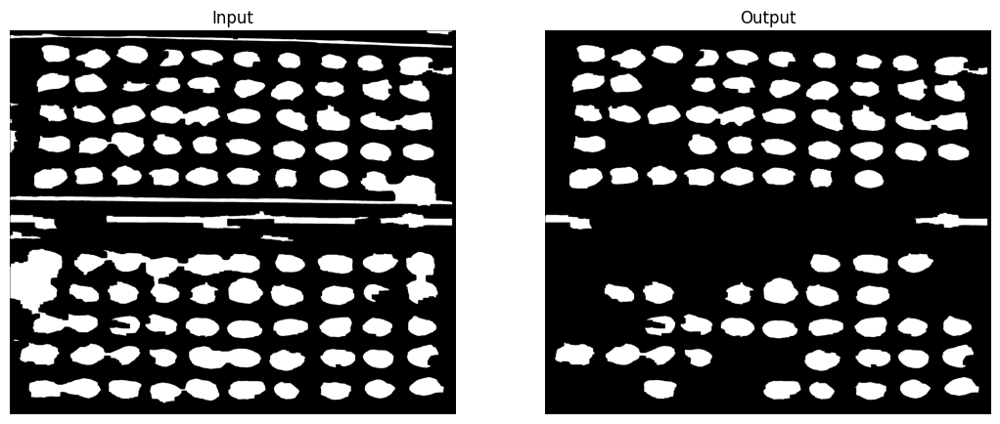

In [ ]:
# Remove undesirable element - part 2
img_floodfill = img_floodfill.astype('uint8')
analysis = cv2.connectedComponentsWithStats(img_floodfill,
                                            4,
                                            cv2.CV_32S)
(totalLabels, label_ids, values, centroid) = analysis

# Initialize a new image to
# store all the output components
output_kakao = np.zeros(img_gray.shape, dtype="uint8")
#Loop through each component
for i in range(1, totalLabels):
    sizes = values[i, cv2.CC_STAT_AREA]
    if (sizes < 60000) and (sizes > 15000):
        componentMask = (label_ids == i).astype("uint8") * 255
        output_kakao = cv2.bitwise_or(output_kakao, componentMask)

# create figure
fig = plt.figure(figsize=(20, 10))
rows = 1
columns = 3

fig.add_subplot(rows, columns, 1)
plt.imshow(img_floodfill,'gray')
plt.axis('off')
plt.title("Input")

fig.add_subplot(rows, columns, 2)
plt.imshow(output_kakao,'gray')
plt.axis('off')
plt.title("Output")

In [ ]:
# mengatur path untuk lokasi output hasil cropping
path = r"/content/drive/MyDrive/Kakao/data_gambar_2/hasil_crop/47"
os.chdir(path)

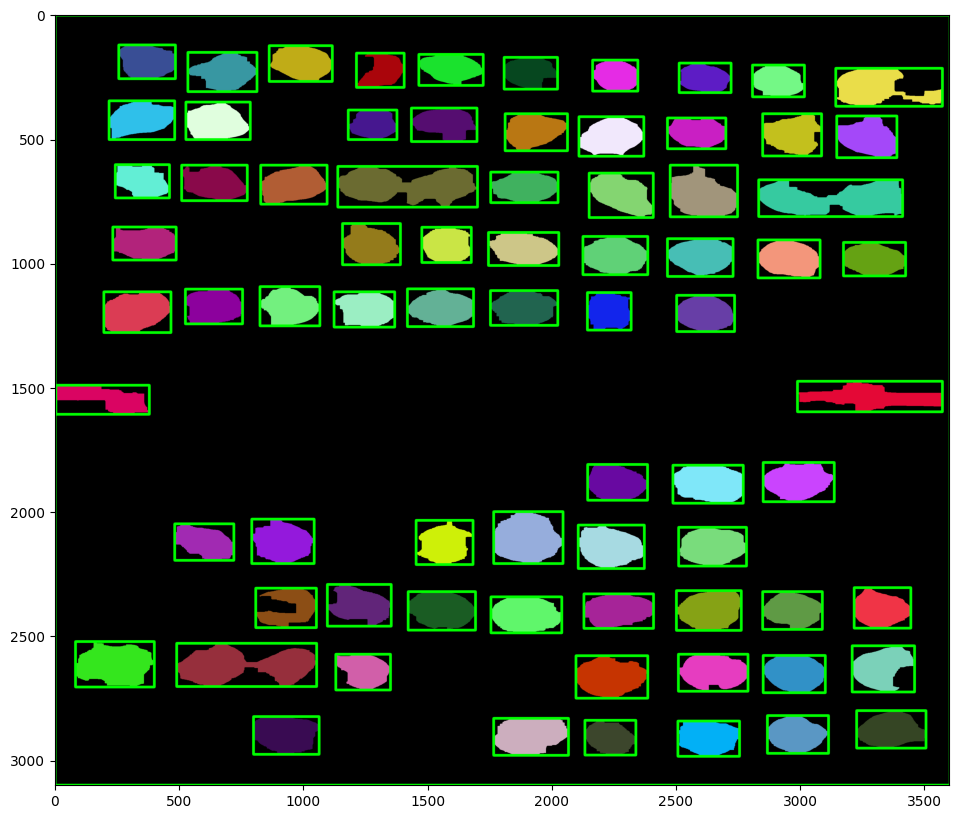

In [ ]:
# membentuk kontur objek biji kakao dengan bounding rectangle
original = img_resize_crop_ori.copy()
connectivity = 8
nb_components, output, stats, centroids = cv2.connectedComponentsWithStats(output_kakao, connectivity, cv2.CV_32S)
sizes = stats[1:, -1]; nb_components = nb_components - 1
min_size = 250 #threshhold value for objects in scene
img_box = np.zeros((img_resize_crop_ori.shape), np.uint8)
CROPP_number = 0
for i in range(0, nb_components+1):
    #if sizes[i] == (sizes > 15000):
    #if sizes[i] >= 15000:
       color = np.random.randint(255,size=3)
       # draw the bounding rectangele around each object
       cv2.rectangle(img_box, (stats[i][0],stats[i][1]),(stats[i][0]+stats[i][2],stats[i][1]+stats[i][3]), (0,255,0), 10)
       img_box[output == i + 1] = color
       CROPP = original[(stats[i][1]-45):(stats[i][1]+stats[i][3]+45), (stats[i][0]-45):(stats[i][0]+stats[i][2]+45)]

       # save hasil cropping citra ke path yang telah diatur
       cv2.imwrite('CROPP47_{}.jpg'.format(CROPP_number), CROPP)
       CROPP_number += 1

# create figure
fig = plt.figure(figsize=(20, 10))
plt.imshow(img_box)

Text(0.5, 1.0, 'Output')

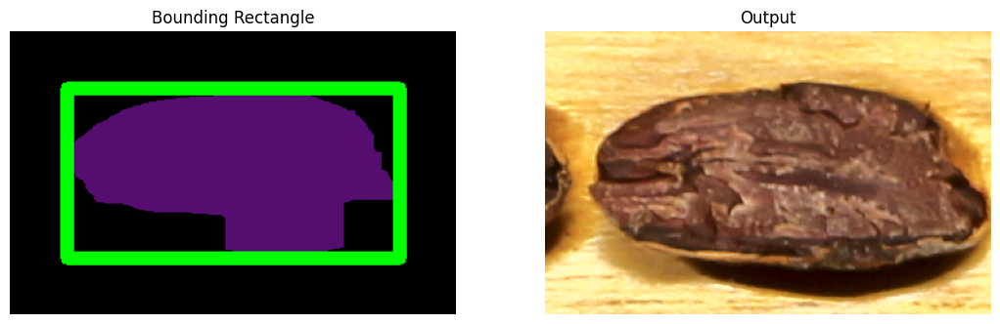

In [ ]:
# Melihat hasil cropping
i=13 # objek iterasi 13
cropped1 = img_box[(stats[i][1]-45):(stats[i][1]+stats[i][3]+45), (stats[i][0]-45):(stats[i][0]+stats[i][2]+45)]
cropped2 = img_resize_crop_ori[(stats[i][1]-45):(stats[i][1]+stats[i][3]+45), (stats[i][0]-45):(stats[i][0]+stats[i][2]+45)]
cropped3 = img_Lab[(stats[i][1]-45):(stats[i][1]+stats[i][3]+45), (stats[i][0]-45):(stats[i][0]+stats[i][2]+45)]
cropped2gray = cv2.cvtColor(cropped2, cv2.COLOR_BGR2GRAY)
cropped2RGB = cv2.cvtColor(cropped2, cv2.COLOR_BGR2RGB)

# create figure
fig = plt.figure(figsize=(20, 10))

# setting values to rows and column variables
rows = 1
columns = 3

# Adds a subplot at the 1st position
fig.add_subplot(rows, columns, 1)
plt.imshow(cropped1,'gray')
plt.axis('off')
plt.title("Bounding Rectangle")

# Adds a subplot at the 2nd position
fig.add_subplot(rows, columns, 2)
plt.imshow(cropped2RGB,'gray')
plt.axis('off')
plt.title("Output")

# Segmentasi Citra (otsu thresholding)

## Menggunakan Erosi Dilasi

Text(0.5, 1.0, 'Gray')

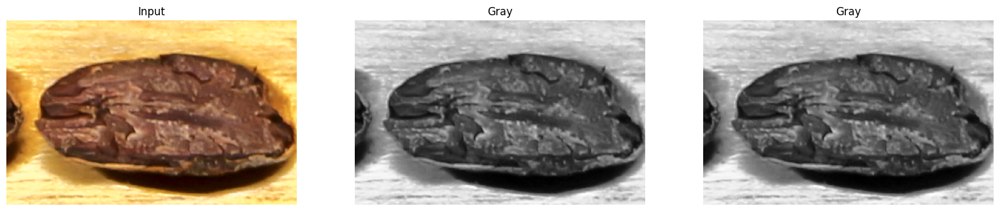

In [ ]:
# define img
#image = cv2.imread("/content/drive/MyDrive/Kakao/Class 2/Ungu/CROP1_7.jpg")
image = cropped2RGB

# convert the image
image_RGB = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) # convert the image to RGB
image_Lab = cv2.cvtColor(image_RGB, cv2.COLOR_RGB2Lab)
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY) # convert the image to grayscale
image_blurred = cv2.GaussianBlur(image_gray, (7, 7), 0)

# create figure
fig = plt.figure(figsize=(20, 10))
rows = 1
columns = 3

# showing image
fig.add_subplot(rows, columns, 1)
plt.imshow(image, 'gray')
plt.axis('off')
plt.title("Input")

fig.add_subplot(rows, columns, 2)
plt.imshow(image_gray,'gray')
plt.axis('off')
plt.title("Gray")

fig.add_subplot(rows, columns, 3)
plt.imshow(image_gray,'gray')
plt.axis('off')
plt.title("Gray")

Text(0.5, 1.0, 'Thresh Binary Inverse')

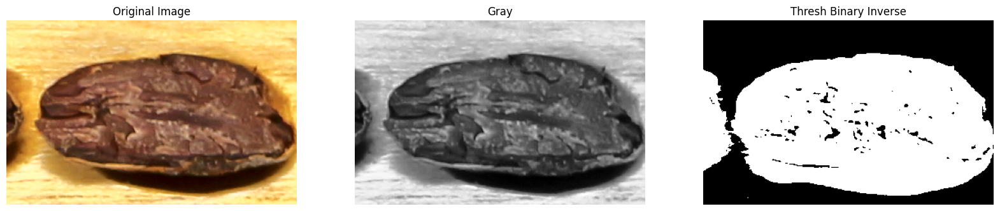

In [ ]:
# otsu thresholding

th = 0
max_val = 255

# Thresh binary
th_val, image_th = cv2.threshold(image_gray,th,max_val,cv2.THRESH_BINARY + cv2.THRESH_OTSU)
image_th_inv = cv2.bitwise_not(image_th)

# create figure
fig = plt.figure(figsize=(20, 10))

# showing image
fig.add_subplot(rows, columns, 1)
plt.imshow(image,'gray')
plt.axis('off')
plt.title("Original Image")

fig.add_subplot(rows, columns, 2)
plt.imshow(image_gray,'gray')
plt.axis('off')
plt.title("Gray")

fig.add_subplot(rows, columns, 3)
plt.imshow(image_th_inv,'gray')
plt.axis('off')
plt.title("Thresh Binary Inverse")

Text(0.5, 1.0, 'After Cleaning')

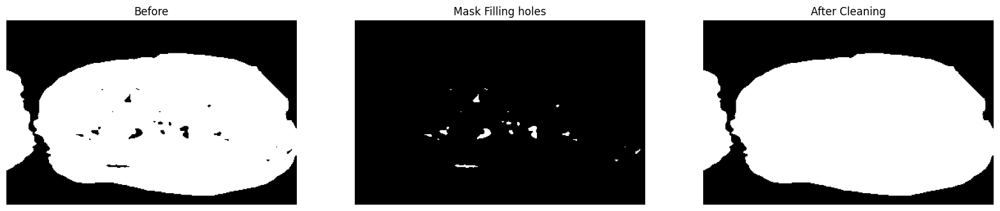

In [ ]:
# Cleaning
im_floodfill2 = image_th_inv.copy()
h, w = image_th_inv.shape[:2]
mask = np.zeros((h+2, w+2), np.uint8)
cv2.floodFill(im_floodfill2, mask, (0,0), 255);
im_floodfill_inv2 = cv2.bitwise_not(im_floodfill2)
im_out2 = image_th_inv | im_floodfill_inv2
kernel = np.ones((4,4), np.uint8)

# create figure
fig = plt.figure(figsize=(20, 10))
rows = 1
columns = 3

# showing image
fig.add_subplot(rows, columns, 1)
plt.imshow(image_th_inv,'gray')
plt.axis('off')
plt.title("Before")

fig.add_subplot(rows, columns, 2)
plt.imshow(im_floodfill_inv2,'gray')
plt.axis('off')
plt.title("Mask Filling holes")

fig.add_subplot(rows, columns, 3)
plt.imshow(im_out2,'gray')
plt.axis('off')
plt.title("After Cleaning")

Text(0.5, 1.0, 'Dilation')

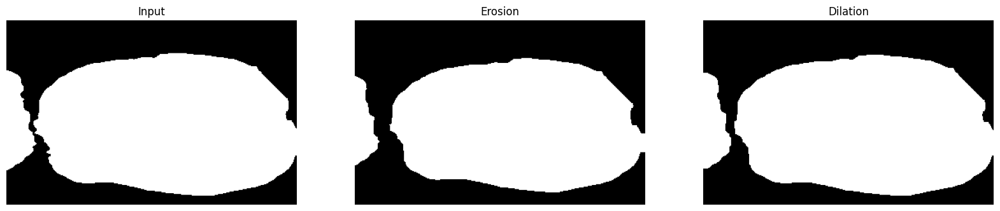

In [ ]:
# Operasi morfologi erosi dan dilasi

# Taking a matrix of size 5 as the kernel
kernel1 = np.ones((6,6), np.uint8)
kernel2 = np.ones((5,5), np.uint8)
img_erosion2 = cv2.erode(im_out2, kernel1, iterations=2)
img_dilation2 = cv2.dilate(img_erosion2, kernel2, iterations=2)

# create figure
fig = plt.figure(figsize=(20, 10))
rows = 1
columns = 3

# Adds a subplot at the 1st position
fig.add_subplot(rows, columns, 1)
plt.imshow(im_out2,'gray')
plt.axis('off')
plt.title("Input")

fig.add_subplot(rows, columns, 2)
plt.imshow(img_erosion2,'gray')
plt.axis('off')
plt.title("Erosion")

fig.add_subplot(rows, columns, 3)
plt.imshow(img_dilation2,'gray')
plt.axis('off')
plt.title("Dilation")

(-0.5, 353.5, 224.5, -0.5)

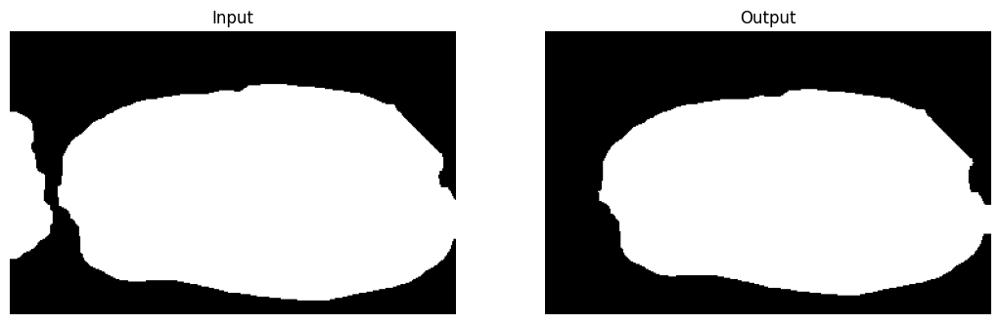

In [ ]:
# menghapus objek kecil tak diinginkan

img_erosion2 = img_erosion2.astype('uint8')
analysis = cv2.connectedComponentsWithStats(img_erosion2, 4, cv2.CV_32S)
(totalLabels, label_ids, values, centroid) = analysis

output_kakao2 = np.zeros(image_blurred.shape, dtype="uint8")
for i in range(1, totalLabels):
    sizes = values[i, cv2.CC_STAT_AREA]
    if (sizes < 100000) and (sizes > 15000):
        componentMask = (label_ids == i).astype("uint8") * 255
        output_kakao2 = cv2.bitwise_or(output_kakao2, componentMask)

# create figure
fig = plt.figure(figsize=(20, 10))
rows = 1
columns = 3

# Adds a subplot at the 1st position
fig.add_subplot(rows, columns, 1)
plt.imshow(img_dilation2,'gray')
plt.axis('off')
plt.title("Input")

fig.add_subplot(rows, columns, 2)
plt.imshow(output_kakao2,'gray')
plt.title("Output")
plt.axis('off')

Text(0.5, 1.0, 'Output')

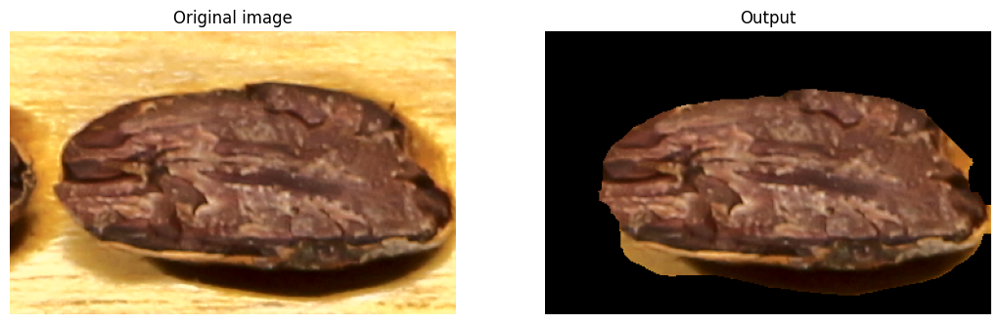

In [ ]:
# Masking
masked_RGB = cv2.bitwise_and(image, image, mask=output_kakao2)
masked_RGB2 = cv2.cvtColor(masked_RGB, cv2.COLOR_BGR2RGB) # convert the image FROM BGR to RGB
cv2.imwrite('masked_RGB.jpg', masked_RGB2)

masked_Lab = cv2.bitwise_and(image_Lab, image_Lab, mask=output_kakao2)
cv2.imwrite('masked_Lab.jpg', masked_Lab)

fig = plt.figure(figsize=(20, 10))
rows = 1
columns = 3

fig.add_subplot(rows, columns, 1)
plt.imshow(image,'gray')
plt.axis('off')
plt.title("Original image")

fig.add_subplot(rows, columns, 2)
plt.imshow(masked_RGB,'gray')
plt.axis('off')
plt.title("Output")

Running semua sampel citra

In [ ]:
import glob
import os
import cv2
import skimage
from PIL import Image

def apply_otsu(folder, sigma=1.0):
    # Memilih semua file yang ada pada folder dengan format .JPG
    sumber_gambar = glob.glob(folder + "/*.jpg")

    # Membuat folder baru di dalam folder dengan nama folder/hasil_otsu apabila folder belum ada
    # apabila sudah ada tidak akan membuat folder baru
    PATH = folder + "/hasil_otsu"
    if not os.path.exists(PATH):
      os.makedirs(PATH)

    for gambar in sumber_gambar:
      pathname, extension = os.path.splitext(gambar)
      # Untuk mendapatkan nama file
      filename = pathname.split('/')
      print(f"Processing {gambar}")

      img = cv2.imread(gambar)
      # convert the image
      img_RGB = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # convert the image to RGB
      img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) # convert the image to grayscale
      img_blurred = cv2.GaussianBlur(img_gray, (7, 7), 0)

      th_val, img_th = cv2.threshold(img_blurred,0,255,cv2.THRESH_BINARY + cv2.THRESH_OTSU)
      img_th_inv = cv2.bitwise_not(img_th)

      # Cleaning
      im_floodfill = img_th_inv.copy()
      h, w = img_th_inv.shape[:2]
      mask = np.zeros((h+2, w+2), np.uint8)
      cv2.floodFill(im_floodfill, mask, (0,0), 255);
      im_floodfill_inv = cv2.bitwise_not(im_floodfill)
      im_out = img_th_inv | im_floodfill_inv
      kernel = np.ones((4,4), np.uint8)

      # opening closing
      kernel1 = np.ones((3,3), np.uint8)
      kernel2 = np.ones((4,4), np.uint8)
      img_erosion1 = cv2.erode(im_out, kernel1, iterations=2)
      img_dilation1 = cv2.dilate(img_erosion1, kernel2, iterations=2)

      # Connected component
      img_erosion1 = img_erosion1.astype('uint8')
      analysis = cv2.connectedComponentsWithStats(img_erosion1, 4, cv2.CV_32S)
      (totalLabels, label_ids, values, centroid) = analysis

      output_kakao = np.zeros(img_blurred.shape, dtype="uint8")
      for i in range(1, totalLabels):
          sizes = values[i, cv2.CC_STAT_AREA]
          if (sizes < 100000) and (sizes > 15000):
              componentMask = (label_ids == i).astype("uint8") * 255
              output_kakao = cv2.bitwise_or(output_kakao, componentMask)

      # masking
      masked = cv2.bitwise_and(img, img, mask=output_kakao)
      img_rgb = cv2.cvtColor(masked, cv2.COLOR_BGR2RGB)

      tmp = cv2.cvtColor(img_rgb, cv2.COLOR_BGR2GRAY)
      _, alpha = cv2.threshold(tmp, 0, 255, cv2.THRESH_BINARY)
      b, g, r = cv2.split(img_rgb)
      rgba = [b, g, r, alpha]
      img_transparent = cv2.merge(rgba, 4)

      image = Image.fromarray(img_transparent) # n x m x 3


      image.save(PATH + "/" + filename[-1] + "_otsu" + ".jpg", "PNG")

In [ ]:
apply_otsu("/content/drive/MyDrive/Kakao/Class 2/Coklat/hasil_otsu3/Gambar cacat")

Processing /content/drive/MyDrive/Kakao/Class 2/Coklat/hasil_otsu3/Gambar cacat/CROP24_51.jpg
Processing /content/drive/MyDrive/Kakao/Class 2/Coklat/hasil_otsu3/Gambar cacat/CROP18_67.jpg
Processing /content/drive/MyDrive/Kakao/Class 2/Coklat/hasil_otsu3/Gambar cacat/CROP24_48.jpg
Processing /content/drive/MyDrive/Kakao/Class 2/Coklat/hasil_otsu3/Gambar cacat/CROP24_21.jpg
Processing /content/drive/MyDrive/Kakao/Class 2/Coklat/hasil_otsu3/Gambar cacat/CROP18_63.jpg
Processing /content/drive/MyDrive/Kakao/Class 2/Coklat/hasil_otsu3/Gambar cacat/CROP11_56.jpg
Processing /content/drive/MyDrive/Kakao/Class 2/Coklat/hasil_otsu3/Gambar cacat/CROP18_32.jpg
Processing /content/drive/MyDrive/Kakao/Class 2/Coklat/hasil_otsu3/Gambar cacat/CROP18_26.jpg
Processing /content/drive/MyDrive/Kakao/Class 2/Coklat/hasil_otsu3/Gambar cacat/CROP11_55.jpg
Processing /content/drive/MyDrive/Kakao/Class 2/Coklat/hasil_otsu3/Gambar cacat/CROP11_47.jpg
Processing /content/drive/MyDrive/Kakao/Class 2/Coklat/hasil

## Menggunakan Opening Closing

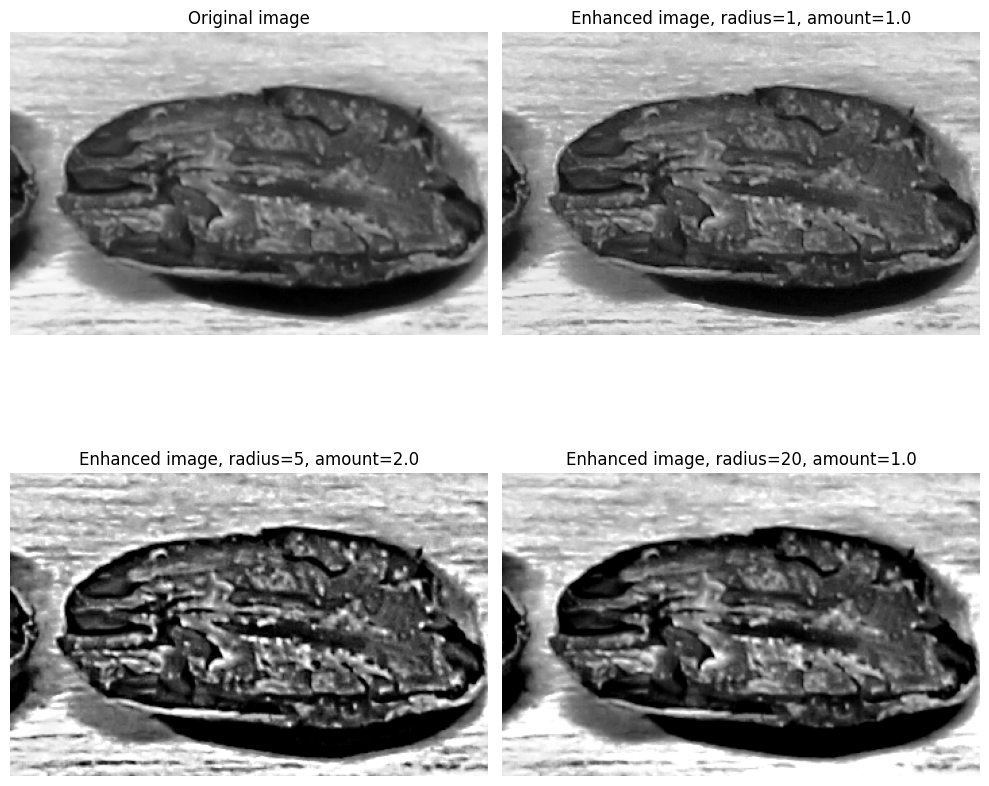

In [ ]:
from skimage.filters import unsharp_mask

image = cropped2RGB
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# image = data.moon()
result_1 = unsharp_mask(gray_image, radius=1, amount=1)
result_2 = unsharp_mask(gray_image, radius=5, amount=2)
result_3 = unsharp_mask(gray_image, radius=20, amount=1)

fig, axes = plt.subplots(nrows=2, ncols=2,
                         sharex=True, sharey=True, figsize=(10, 10))

ax = axes.ravel()

ax[0].imshow(gray_image, cmap=plt.cm.gray)
ax[0].set_title('Original image')
ax[1].imshow(result_1, cmap=plt.cm.gray)
ax[1].set_title('Enhanced image, radius=1, amount=1.0')
ax[2].imshow(result_2, cmap=plt.cm.gray)
ax[2].set_title('Enhanced image, radius=5, amount=2.0')
ax[3].imshow(result_3, cmap=plt.cm.gray)
ax[3].set_title('Enhanced image, radius=20, amount=1.0')

for a in ax:
    a.axis('off')
fig.tight_layout()
plt.show()


Text(0.5, 1.0, 'Inverse Thresh Binary')

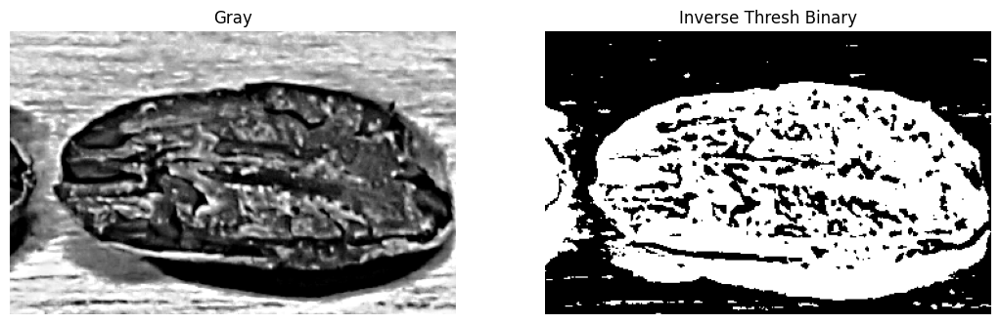

In [ ]:
from skimage.filters import (threshold_otsu, threshold_triangle, threshold_niblack, threshold_sauvola)
from skimage import img_as_ubyte

thresh_otsu = threshold_otsu(result_2)
binary_otsu = result_2 < thresh_otsu
binary_otsu = img_as_ubyte(binary_otsu)

# create figure
fig = plt.figure(figsize=(20, 10))

# showing image
fig.add_subplot(rows, columns, 1)
plt.imshow(result_2,'gray')
plt.axis('off')
plt.title("Gray")

fig.add_subplot(rows, columns, 2)
plt.imshow(binary_otsu,'gray')
plt.axis('off')
plt.title("Inverse Thresh Binary")

Text(0.5, 1.0, 'Filling Holes')

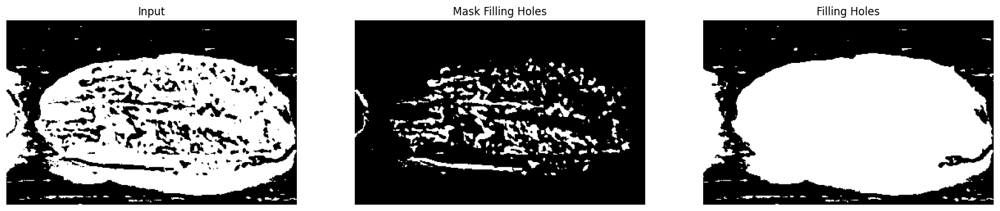

In [ ]:
#Cleaning
im_floodfill3 = binary_otsu.copy()
h, w = binary_otsu.shape[:2]
mask = np.zeros((h+2, w+2), np.uint8)
cv2.floodFill(im_floodfill3, mask, (0,0), 255);
im_floodfill_inv3 = cv2.bitwise_not(im_floodfill3)
im_out3 = binary_otsu | im_floodfill_inv3

#fig, ax = plt.subplots(1,2, figsize=(12,5))
#ax[0].imshow(binary_otsu);
#ax[0].set_title('Original Image')

#ax[1].imshow(im_out3)
#ax[1].set_title('Closed Image')


# create figure
fig = plt.figure(figsize=(20, 10))
fig.add_subplot(rows, columns, 1)
plt.imshow(binary_otsu,'gray')
plt.axis('off')
plt.title("Input")

# showing image
fig.add_subplot(rows, columns, 2)
plt.imshow(im_floodfill_inv3,'gray')
plt.axis('off')
plt.title("Mask Filling Holes")

fig.add_subplot(rows, columns, 3)
plt.imshow(im_out3,'gray')
plt.axis('off')
plt.title("Filling Holes")

Text(0.5, 1.0, 'Closing (Kernel Dimensi 10 x 10)')

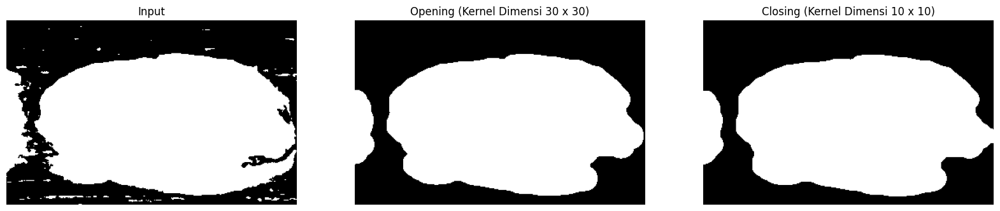

In [ ]:
# opening
kernel_elipse = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (30, 30))
kernel = np.ones((8, 8), np.uint8)
opening = cv2.morphologyEx(im_out3, cv2.MORPH_OPEN, kernel_elipse)

kernel_elipse = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (10, 10))
kernel = np.ones((8, 8), np.uint8)
closing = cv2.morphologyEx(opening, cv2.MORPH_CLOSE, kernel_elipse)

#fig, ax = plt.subplots(1,2, figsize=(12,5))
#ax[0].imshow(im_out3);
#ax[0].set_title('Original Image')

#ax[1].imshow(opening)
#ax[1].set_title('Opened Image')

# create figure
fig = plt.figure(figsize=(20, 10))

# showing image
fig.add_subplot(rows, columns, 1)
plt.imshow(im_out3,'gray')
plt.axis('off')
plt.title("Input")

fig.add_subplot(rows, columns, 2)
plt.imshow(opening,'gray')
plt.axis('off')
plt.title("Opening (Kernel Dimensi 30 x 30)")

fig.add_subplot(rows, columns, 3)
plt.imshow(closing,'gray')
plt.axis('off')
plt.title("Closing (Kernel Dimensi 10 x 10)")

Text(0.5, 1.0, 'Output')

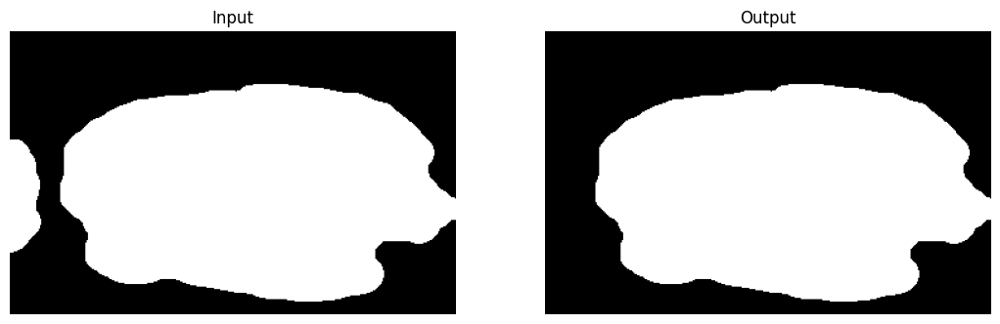

In [ ]:
closing = closing.astype('uint8')
analysis = cv2.connectedComponentsWithStats(closing, 4, cv2.CV_32S)
(totalLabels, label_ids, values, centroid) = analysis

output_kakao3 = np.zeros(gray_image.shape, dtype="uint8")
for i in range(1, totalLabels):
    sizes = values[i, cv2.CC_STAT_AREA]
    if (sizes < 100000) and (sizes > 15000):
        componentMask = (label_ids == i).astype("uint8") * 255
        output_kakao3 = cv2.bitwise_or(output_kakao3, componentMask)

#fig, ax = plt.subplots(1,2, figsize=(12,5))
#ax[0].imshow(closing);
#ax[0].set_title('input')

#ax[1].imshow(output_kakao3)
#ax[1].set_title('output')

# create figure
fig = plt.figure(figsize=(20, 10))

# showing image
fig.add_subplot(rows, columns, 1)
plt.imshow(closing,'gray')
plt.axis('off')
plt.title("Input")

fig.add_subplot(rows, columns, 2)
plt.imshow(output_kakao3,'gray')
plt.axis('off')
plt.title("Output")

Text(0.5, 1.0, 'Output Pre-processing Citra')

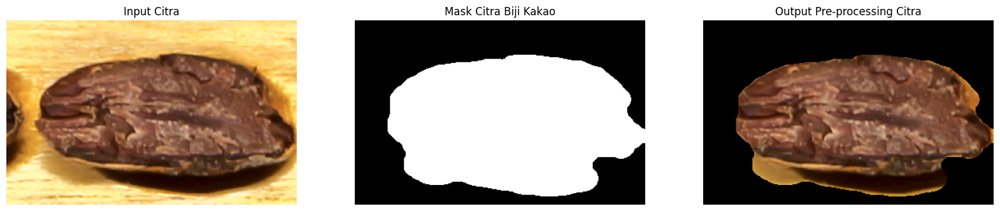

In [ ]:
# masking
mask1 = cv2.cvtColor(output_kakao3, cv2.COLOR_GRAY2BGR)  # 3 channel mask
coba1 = cv2.bitwise_and(image, mask1)
# create figure
fig = plt.figure(figsize=(20, 10))
rows = 1
columns = 3

# showing image
fig.add_subplot(rows, columns, 1)
plt.imshow(image, 'gray')
plt.axis('off')
plt.title("Input Citra")

fig.add_subplot(rows, columns, 2)
plt.imshow(output_kakao3, 'gray')
plt.axis('off')
plt.title("Mask Citra Biji Kakao")

fig.add_subplot(rows, columns, 3)
plt.imshow(coba1,'gray')
plt.axis('off')
plt.title("Output Pre-processing Citra")

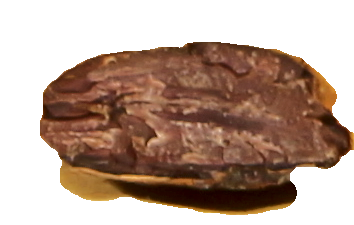

In [ ]:
# background hitam dibuat transparan
coba1_RGB = image_RGB = cv2.cvtColor(coba1, cv2.COLOR_BGR2RGB) # convert the image to RGB
tmp = cv2.cvtColor(coba1_RGB, cv2.COLOR_BGR2GRAY)
_, alpha = cv2.threshold(tmp, 0, 255, cv2.THRESH_BINARY)
b, g, r = cv2.split(coba1_RGB)
rgba = [b, g, r, alpha]
dst = cv2.merge(rgba, 4)


cv2_imshow(dst)

Running semua sampel citra

In [ ]:
import glob
import os
import cv2
import skimage
from PIL import Image
from skimage.filters import unsharp_mask
from skimage.filters import (threshold_otsu, threshold_triangle, threshold_niblack, threshold_sauvola)
from skimage import img_as_ubyte

def apply_otsu(folder, sigma=1.0):
    # Memilih semua file yang ada pada folder dengan format .JPG
    sumber_gambar = glob.glob(folder + "/*.jpg")

    # Membuat folder baru di dalam folder dengan nama folder/hasil_otsu apabila folder belum ada
    # apabila sudah ada tidak akan membuat folder baru
    PATH = folder + "/hasil_otsu"
    if not os.path.exists(PATH):
      os.makedirs(PATH)

    for gambar in sumber_gambar:
      pathname, extension = os.path.splitext(gambar)
      # Untuk mendapatkan nama file
      filename = pathname.split('/')
      print(f"Processing {gambar}")

      img = cv2.imread(gambar)
      # convert the image
      img_RGB = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # convert the image to RGB
      img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) # convert the image to grayscale
      img_blurred = cv2.GaussianBlur(img_gray, (7, 7), 0)

      # edge detection
      result = unsharp_mask(img_blurred, radius=5, amount=2)

      # threshold
      thresh_otsu = threshold_otsu(result)
      binary_otsu = result < thresh_otsu
      binary_otsu = img_as_ubyte(binary_otsu)

      # Cleaning
      im_floodfill = binary_otsu.copy()
      h, w = binary_otsu.shape[:2]
      mask = np.zeros((h+2, w+2), np.uint8)
      cv2.floodFill(im_floodfill, mask, (0,0), 255);
      im_floodfill_inv = cv2.bitwise_not(im_floodfill)
      im_out = binary_otsu | im_floodfill_inv
      kernel = np.ones((4,4), np.uint8)

      kernel_elipse1 = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (30, 30))
      kernel_elipse2 = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (20, 20))
      opening = cv2.morphologyEx(im_out, cv2.MORPH_OPEN, kernel_elipse1)
      closing = cv2.morphologyEx(opening, cv2.MORPH_CLOSE, kernel_elipse2)

      # Connected component
      closing = closing.astype('uint8')
      analysis = cv2.connectedComponentsWithStats(closing, 4, cv2.CV_32S)
      (totalLabels, label_ids, values, centroid) = analysis

      output_kakao = np.zeros(img_blurred.shape, dtype="uint8")
      for i in range(1, totalLabels):
          sizes = values[i, cv2.CC_STAT_AREA]
          if (sizes < 100000) and (sizes > 5000):
              componentMask = (label_ids == i).astype("uint8") * 255
              output_kakao = cv2.bitwise_or(output_kakao, componentMask)

      # masking
      mask1 = cv2.cvtColor(output_kakao, cv2.COLOR_GRAY2BGR)  # 3 channel mask
      coba1 = cv2.bitwise_and(img, mask1)

      # make a transparent image
      img_rgb = cv2.cvtColor(coba1, cv2.COLOR_BGR2RGB)

      tmp = cv2.cvtColor(img_rgb, cv2.COLOR_BGR2GRAY)
      _, alpha = cv2.threshold(tmp, 0, 255, cv2.THRESH_BINARY)
      b, g, r = cv2.split(img_rgb)
      rgba = [b, g, r, alpha]
      img_transparent = cv2.merge(rgba, 4)

      #image = Image.fromarray(img_transparent) # untuk citra background transparan
      image = Image.fromarray(img_rgb) # untuk citra dengan background hitam

      image.save(PATH + "/" + filename[-1] + "_otsu" + ".jpg", "PNG")

In [ ]:
apply_otsu("/content/drive/MyDrive/Kakao/(4) train test validation/tambahan")

Processing /content/drive/MyDrive/Kakao/(4) train test validation/tambahan/CROP18_8.jpg
Processing /content/drive/MyDrive/Kakao/(4) train test validation/tambahan/CROP11_8.jpg
Processing /content/drive/MyDrive/Kakao/(4) train test validation/tambahan/CROP11_33.jpg
Processing /content/drive/MyDrive/Kakao/(4) train test validation/tambahan/CROP10_31.jpg
Processing /content/drive/MyDrive/Kakao/(4) train test validation/tambahan/CROP23_43.jpg
Processing /content/drive/MyDrive/Kakao/(4) train test validation/tambahan/CROP18_26.jpg
Processing /content/drive/MyDrive/Kakao/(4) train test validation/tambahan/CROP47_65.jpg
Processing /content/drive/MyDrive/Kakao/(4) train test validation/tambahan/CROP10_9.jpg
Processing /content/drive/MyDrive/Kakao/(4) train test validation/tambahan/CROP24_79.jpg
Processing /content/drive/MyDrive/Kakao/(4) train test validation/tambahan/CROP44_41.jpg
Processing /content/drive/MyDrive/Kakao/(4) train test validation/tambahan/CROP11_45.jpg
Processing /content/driv

# Ekstrak Warna

In [ ]:
# Color extract untuk semua gambar di file
import glob
import os
import numpy as np
import pandas as pd
import cv2
import skimage
from PIL import Image

def apply_extract(folder, sigma=1.0):
    path = glob.glob(folder + "*/*.jpg")
    data = []
    data_normal = []
    index_normal = []
    for n in path:
        # Untuk mendapatkan nama file
        pathname, extension = os.path.splitext(n)
        filename = pathname.split('/')
        print(f"Processing {n}")

        img = cv2.imread(n)
        img_RGB = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  #Matplot lib expects img in RGB format but OpenCV provides it in BGR.
        img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        img_Lab = cv2.cvtColor(img, cv2.COLOR_RGB2Lab)
        img_HSV = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)

        th_val, img_th = cv2.threshold(img_gray,0,255,cv2.THRESH_BINARY + cv2.THRESH_OTSU)
        im_floodfill = img_th.copy()
        h, w = img_th.shape[:2]
        mask = np.zeros((h+2, w+2), np.uint8)
        cv2.floodFill(im_floodfill, mask, (0,0), 255);
        im_floodfill_inv = cv2.bitwise_not(im_floodfill)
        im_out = img_th | im_floodfill_inv

        ## find the nozero regions in the erode
        imask = im_out>0

        ## create a Mat like pictureRaw
        canvas_RGB = np.full_like(img_RGB, np.array([0,0,0]), dtype=np.uint8)
        canvas_Lab = np.full_like(img_Lab, np.array([0,0,0]), dtype=np.uint8)
        canvas_HSV = np.full_like(img_HSV, np.array([0,0,0]), dtype=np.uint8)

        ## set mask
        canvas_RGB[imask] = img_RGB[imask]
        channels_meanRGB = cv2.mean(canvas_RGB, im_out)
        channelsRGB = np.array([(channels_meanRGB[0], channels_meanRGB[1], channels_meanRGB[2])])

        canvas_Lab[imask] = img_Lab[imask]
        channels_meanLab = cv2.mean(canvas_Lab, im_out)
        channelsLab = np.array([(channels_meanLab[0], channels_meanLab[1], channels_meanLab[2])])

        canvas_HSV[imask] = img_HSV[imask]
        channels_meanHSV = cv2.mean(canvas_HSV, im_out)
        channelsHSV = np.array([(channels_meanHSV[0], channels_meanHSV[1], channels_meanHSV[2])])

        channelstotal = np.c_[channelsRGB, channelsLab, channelsHSV]

        index_normal.append(filename[-1])
        data_normal.extend(channelstotal)

    index_normal = pd.DataFrame(index_normal)
    result_normal = pd.DataFrame(data_normal, columns=['R_ave', 'G_ave', 'B_ave', 'L_ave', 'a_ave', 'b_ave', 'H_ave', 'S_ave', 'V_ave'])
    result_normal.index = list(index_normal[0])

    return result_normal

In [ ]:
# menampilkan hasil
df_normal = apply_extract("/content/drive/MyDrive/Kakao/(4) train test validation/background/test/partly brown")
df_normal

Processing /content/drive/MyDrive/Kakao/(4) train test validation/background/test/partly brown/CROP43_77.jpg
Processing /content/drive/MyDrive/Kakao/(4) train test validation/background/test/partly brown/CROP43_73.jpg
Processing /content/drive/MyDrive/Kakao/(4) train test validation/background/test/partly brown/CROP43_49.jpg
Processing /content/drive/MyDrive/Kakao/(4) train test validation/background/test/partly brown/CROP43_68.jpg
Processing /content/drive/MyDrive/Kakao/(4) train test validation/background/test/partly brown/CROP43_47.jpg
Processing /content/drive/MyDrive/Kakao/(4) train test validation/background/test/partly brown/CROP43_66.jpg
Processing /content/drive/MyDrive/Kakao/(4) train test validation/background/test/partly brown/CROP43_50.jpg
Processing /content/drive/MyDrive/Kakao/(4) train test validation/background/test/partly brown/CROP43_7.jpg
Processing /content/drive/MyDrive/Kakao/(4) train test validation/background/test/partly brown/CROP43_2.jpg
Processing /content/d

,R_ave,G_ave,B_ave,L_ave,a_ave,b_ave,H_ave,S_ave,V_ave
CROP43_77,163.155997,106.319193,49.527008,110.889387,130.215669,92.731612,107.713656,171.612638,163.155997
CROP43_73,156.298950,101.518945,46.442862,106.018774,130.170770,93.678586,107.727190,172.440792,156.298950
CROP43_49,167.634397,109.401176,45.601131,113.373634,129.325582,91.591387,106.832504,178.629469,167.634397
CROP43_68,158.093572,99.505163,38.219348,104.035358,130.817777,91.441238,107.132815,185.003666,158.094171
CROP43_47,148.071312,91.873654,33.839646,96.223245,131.071834,92.599591,107.097921,187.840993,148.071312
CROP43_66,160.429164,107.632950,50.726775,111.194744,128.741855,94.903645,107.669457,164.870944,160.429164
CROP43_50,160.448150,100.090472,41.160725,104.993310,131.863716,90.605454,107.669068,182.578483,160.448150
CROP43_7,165.091560,118.263253,64.887291,121.424000,126.152412,97.870344,106.252939,153.531120,165.091560
CROP43_2,179.117799,136.006325,86.327537,137.930157,124.876656,100.134768,105.195347,137.805838,179.117799
CROP44_7,176.009243,128.567559,69.579556,130.890598,124.595788,97.237742,104.830872,155.352845,176.009243


In [ ]:
# save ke excel
df_normal.to_excel("output 1. Robusta Pagar Alam T-2-A.xlsx")

# Box-plot

In [ ]:
# import the required library
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


# load data yang sudah rapih
df = pd.read_excel("/content/drive/MyDrive/Kakao/(4) fitur warna/Fitur warna CLASS (4) RAPIH - Copy.xlsx")

# display 5 rows of dataset
df.head()

,Class,R_ave,G_ave,B_ave,L_ave,a_ave,b_ave,H_ave,S_ave,V_ave
0,Well fermented,91.481338,48.525608,26.400938,52.246093,135.770709,99.920209,110.415439,181.756140,91.481338
1,Well fermented,95.282875,50.943580,28.980800,55.032842,135.864423,99.431892,110.150701,176.595527,95.282875
2,Well fermented,90.287516,50.776015,35.857339,55.541116,135.677514,102.541086,112.668588,151.847799,90.287516
3,Well fermented,100.195198,60.423461,45.925567,65.741350,135.351826,102.837686,112.635808,144.334737,100.195198
4,Well fermented,87.417698,48.182070,31.644084,52.094964,135.477126,102.445835,111.750473,164.592320,87.417698


<Axes: xlabel='Class', ylabel='b_ave'>

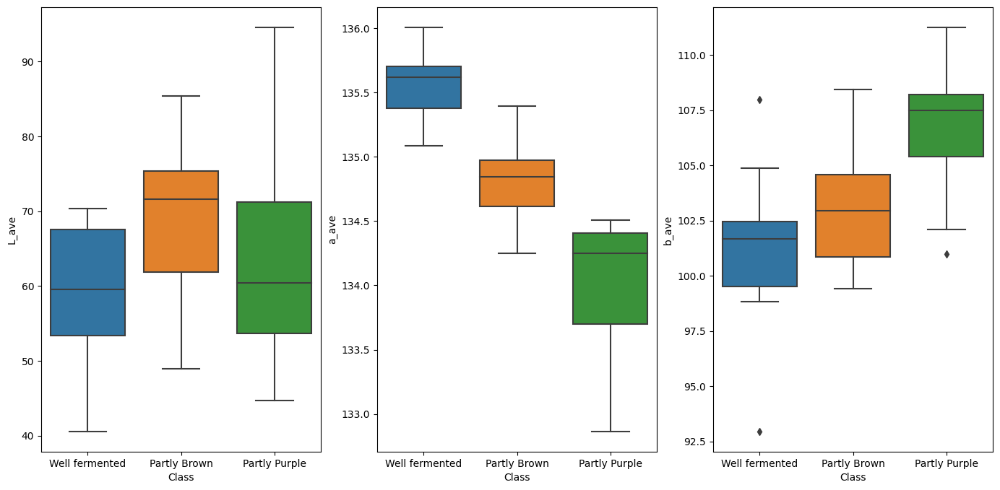

In [ ]:
fig, axs = plt.subplots(ncols=3, figsize=(17, 8))
sns.boxplot(x = df["Class"], y = df["L_ave"], ax=axs[0])
sns.boxplot(x = df["Class"], y = df["a_ave"], ax=axs[1])
sns.boxplot(x = df["Class"], y = df["b_ave"], ax=axs[2])

# metode edge detection (tidak digunakan)

<ipython-input-167-844509807970>:15: RuntimeWarning: invalid value encountered in sqrt
  edgexy = np.sqrt(sobel_y ** 2 + sobel_x ** 2)


Text(0.5, 1.0, 'Object Contour with Sobel Edge Detection')

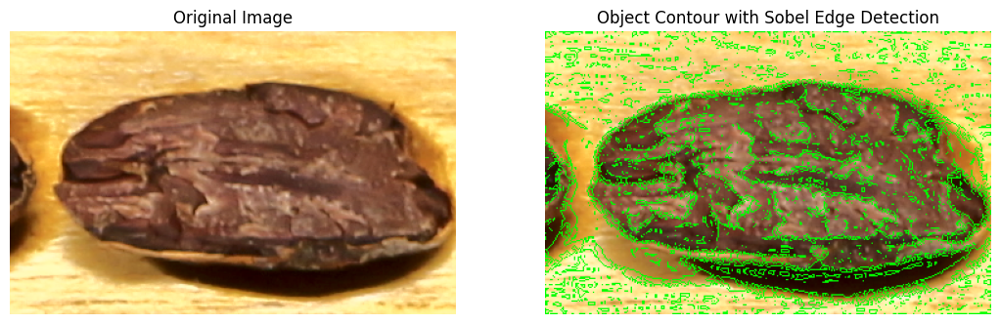

In [ ]:
original_img = cropped2RGB
original_img_RGB = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB) # convert the image to RGB
selected_img2 = cv2.cvtColor(original_img_RGB, cv2.COLOR_BGR2RGB) # convert the image to RGB
grey = cv2.cvtColor(selected_img2, cv2.COLOR_RGB2GRAY)

#blur
median_blur = cv2.medianBlur(grey, 9)
#sobel
sobel_x = cv2.Sobel(median_blur, cv2.CV_16S, 1, 0, ksize=-1)
sobel_x_16S = np.absolute(sobel_x)
sobel_x_8U = np.uint8(sobel_x_16S)
sobel_y = cv2.Sobel(median_blur, cv2.CV_16S, 0, 1, ksize=-1)
sobel_y_16S = np.absolute(sobel_y)
sobel_y_8U = np.uint8(sobel_y_16S)
edgexy = np.sqrt(sobel_y ** 2 + sobel_x ** 2)
#find contour
converted = cv2.convertScaleAbs(edgexy)
ret, thresh = cv2.threshold(converted, 10, 20, cv2.THRESH_BINARY_INV)
c, h = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
for contour in c:
   cv2.drawContours(selected_img2, [contour], -1, (0, 255, 0))

# create figure
fig = plt.figure(figsize=(20, 10))
rows = 1
columns = 3

# showing image
fig.add_subplot(rows, columns, 1)
plt.imshow(original_img,'gray')
plt.axis('off')
plt.title("Original Image")

fig.add_subplot(rows, columns, 2)
plt.imshow(selected_img2,'gray')
plt.axis('off')
plt.title("Object Contour with Sobel Edge Detection")

TypeError: ignored

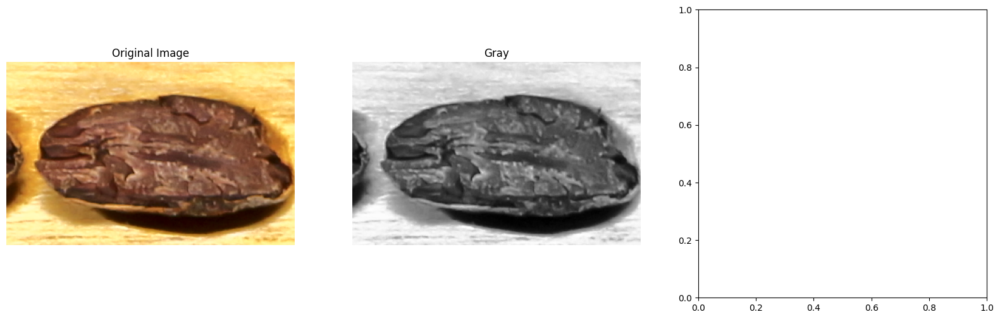

In [ ]:
image = cropped2RGB

# convert the image
image_RGB = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) # convert the image to RGB
image_Lab = cv2.cvtColor(image_RGB, cv2.COLOR_RGB2Lab)
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY) # convert the image to grayscale
image_blurred = cv2.GaussianBlur(image_gray, (7, 7), 0)

# create figure
fig = plt.figure(figsize=(20, 10))
rows = 1
columns = 3

# showing image
fig.add_subplot(rows, columns, 1)
plt.imshow(image, 'gray')
plt.axis('off')
plt.title("Input")

fig.add_subplot(rows, columns, 2)
plt.imshow(image_gray,'gray')
plt.axis('off')
plt.title("Gray")

fig.add_subplot(rows, columns, 3)
plt.imshow(image_gray,'gray')
plt.axis('off')
plt.title("Gray")

Text(0.5, 1.0, 'Thresh Binary')

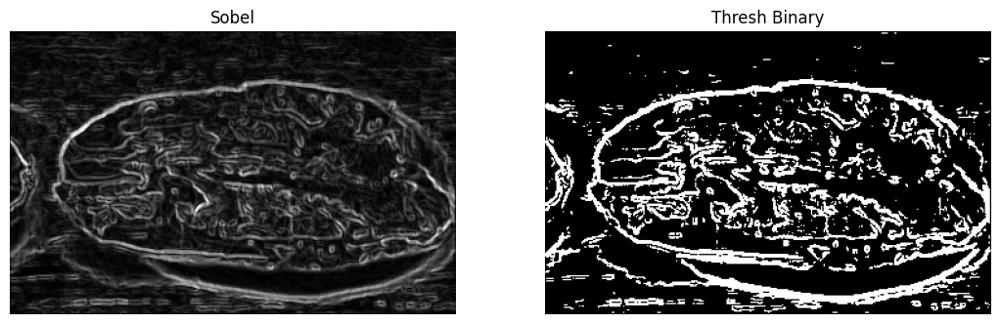

In [ ]:
# sobel di segmentasi dengan otsu

th = 0
max_val = 255

# Thresh binaryMZMZ
th_val, image_th = cv2.threshold(edge,th,max_val,cv2.THRESH_BINARY + cv2.THRESH_OTSU)

# create figure
fig = plt.figure(figsize=(20, 10))

# showing image
fig.add_subplot(rows, columns, 1)
plt.imshow(edge,'gray')
plt.axis('off')
plt.title("Sobel")

fig.add_subplot(rows, columns, 2)
plt.imshow(image_th,'gray')
plt.axis('off')
plt.title("Thresh Binary")

Text(0.5, 1.0, 'After Cleaning')

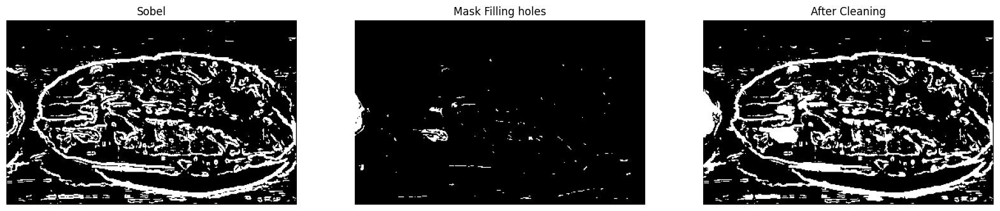

In [ ]:
# Cleaning
im_floodfill2 = image_th.copy()
h, w = image_th.shape[:2]
mask = np.zeros((h+2, w+2), np.uint8)
cv2.floodFill(im_floodfill2, mask, (0,0), 255);
im_floodfill_inv2 = cv2.bitwise_not(im_floodfill2)
im_out2 = image_th | im_floodfill_inv2
kernel = np.ones((4,4), np.uint8)

# create figure
fig = plt.figure(figsize=(20, 10))
rows = 1
columns = 3

# showing image
fig.add_subplot(rows, columns, 1)
plt.imshow(image_th,'gray')
plt.axis('off')
plt.title("Sobel")

fig.add_subplot(rows, columns, 2)
plt.imshow(im_floodfill_inv2,'gray')
plt.axis('off')
plt.title("Mask Filling holes")

fig.add_subplot(rows, columns, 3)
plt.imshow(im_out2,'gray')
plt.axis('off')
plt.title("After Cleaning")

Text(0.5, 1.0, 'Closing (Kernel Dimensi 10 x 10)')

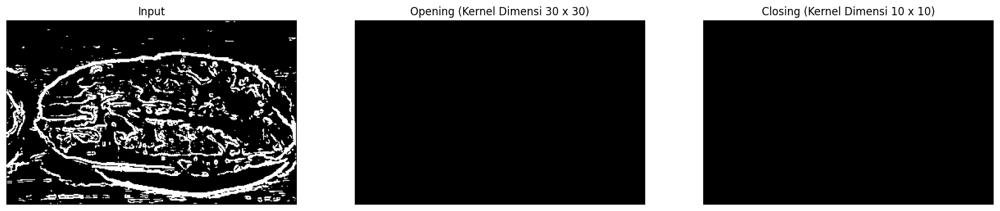

In [ ]:
# opening
kernel_elipse = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (30, 30))
kernel = np.ones((8, 8), np.uint8)
opening = cv2.morphologyEx(image_th, cv2.MORPH_OPEN, kernel_elipse)

kernel_elipse = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (10, 10))
kernel = np.ones((8, 8), np.uint8)
closing = cv2.morphologyEx(opening, cv2.MORPH_CLOSE, kernel_elipse)

# create figure
fig = plt.figure(figsize=(20, 10))

# showing image
fig.add_subplot(rows, columns, 1)
plt.imshow(image_th,'gray')
plt.axis('off')
plt.title("Input")

fig.add_subplot(rows, columns, 2)
plt.imshow(opening,'gray')
plt.axis('off')
plt.title("Opening (Kernel Dimensi 30 x 30)")

fig.add_subplot(rows, columns, 3)
plt.imshow(closing,'gray')
plt.axis('off')
plt.title("Closing (Kernel Dimensi 10 x 10)")

Text(0.5, 1.0, 'Output')

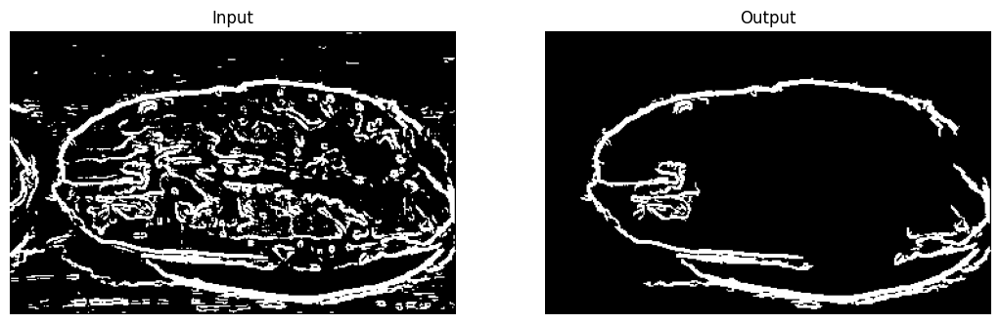

In [ ]:
image_th = image_th.astype('uint8')
analysis = cv2.connectedComponentsWithStats(image_th, 4, cv2.CV_32S)
(totalLabels, label_ids, values, centroid) = analysis

output_kakao3 = np.zeros(gray.shape, dtype="uint8")
for i in range(1, totalLabels):
    sizes = values[i, cv2.CC_STAT_AREA]
    if (sizes < 10000) and (sizes > 1500):
        componentMask = (label_ids == i).astype("uint8") * 255
        output_kakao3 = cv2.bitwise_or(output_kakao3, componentMask)

#fig, ax = plt.subplots(1,2, figsize=(12,5))
#ax[0].imshow(closing);
#ax[0].set_title('input')

#ax[1].imshow(output_kakao3)
#ax[1].set_title('output')

# create figure
fig = plt.figure(figsize=(20, 10))

# showing image
fig.add_subplot(rows, columns, 1)
plt.imshow(image_th,'gray')
plt.axis('off')
plt.title("Input")

fig.add_subplot(rows, columns, 2)
plt.imshow(output_kakao3,'gray')
plt.axis('off')
plt.title("Output")

Text(0.5, 1.0, 'After Cleaning')

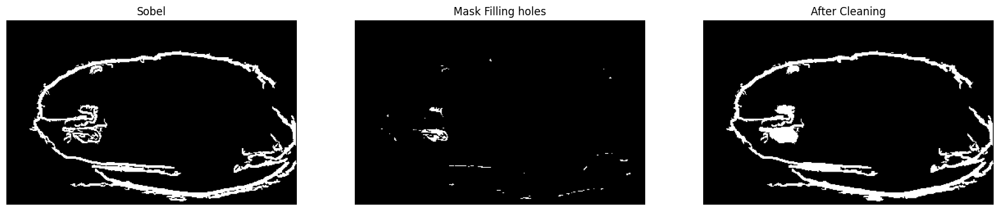

In [ ]:
# Cleaning
im_floodfill2 = output_kakao3.copy()
h, w = output_kakao3.shape[:2]
mask = np.zeros((h+2, w+2), np.uint8)
cv2.floodFill(im_floodfill2, mask, (0,0), 255);
im_floodfill_inv2 = cv2.bitwise_not(im_floodfill2)
im_out2 = output_kakao3 | im_floodfill_inv2
kernel = np.ones((4,4), np.uint8)

# create figure
fig = plt.figure(figsize=(20, 10))
rows = 1
columns = 3

# showing image
fig.add_subplot(rows, columns, 1)
plt.imshow(output_kakao3,'gray')
plt.axis('off')
plt.title("Sobel")

fig.add_subplot(rows, columns, 2)
plt.imshow(im_floodfill_inv2,'gray')
plt.axis('off')
plt.title("Mask Filling holes")

fig.add_subplot(rows, columns, 3)
plt.imshow(im_out2,'gray')
plt.axis('off')
plt.title("After Cleaning")

<ipython-input-115-da7afd203f0e>:15: RuntimeWarning: invalid value encountered in sqrt
  edgexy = np.sqrt(sobel_y ** 2 + sobel_x ** 2)


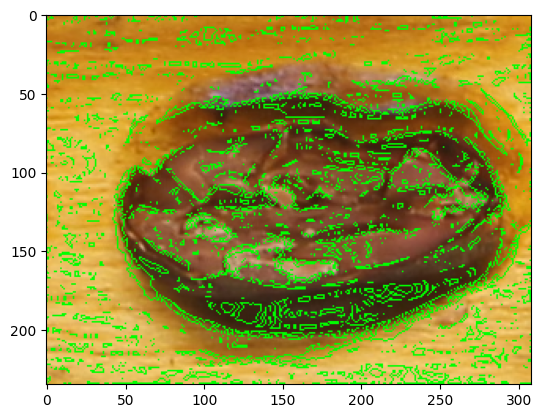

In [ ]:
original_img = cv2.imread('/content/drive/MyDrive/Kakao/data_gambar_2/hasil_crop/1/CROP1_23.jpg')
original_img_RGB = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB) # convert the image to RGB
selected_img2 = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB) # convert the image to RGB
grey = cv2.cvtColor(selected_img2, cv2.COLOR_RGB2GRAY)

#blur
median_blur = cv2.medianBlur(grey, 9)
#sobel
sobel_x = cv2.Sobel(median_blur, cv2.CV_16S, 1, 0, ksize=-1)
sobel_x_16S = np.absolute(sobel_x)
sobel_x_8U = np.uint8(sobel_x_16S)
sobel_y = cv2.Sobel(median_blur, cv2.CV_16S, 0, 1, ksize=-1)
sobel_y_16S = np.absolute(sobel_y)
sobel_y_8U = np.uint8(sobel_y_16S)
edgexy = np.sqrt(sobel_y ** 2 + sobel_x ** 2)
#find contour
converted = cv2.convertScaleAbs(edgexy)
ret, thresh = cv2.threshold(converted, 10, 20, cv2.THRESH_BINARY_INV)
c, h = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
for contour in c:
   cv2.drawContours(selected_img2, [contour], -1, (0, 255, 0))
plt.imshow(selected_img2, cmap="gray")
plt.show()

Text(0.5, 1.0, 'Sobel')

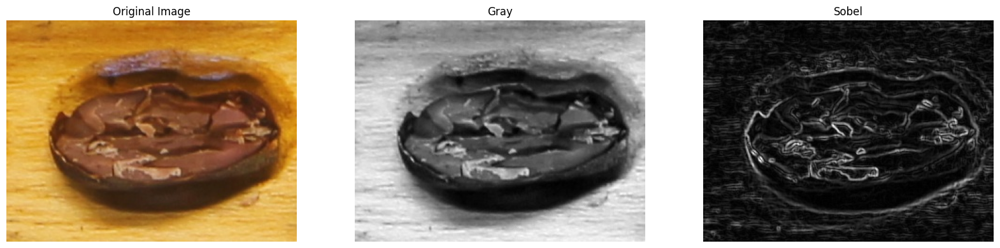

In [ ]:
import cv2
ddept=cv2.CV_16S

original_img = cv2.imread('/content/drive/MyDrive/Kakao/data_gambar_2/hasil_crop/1/CROP1_23.jpg')
selected_img = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB) # convert the image to RGB
gray = cv2.cvtColor(original_img, cv2.COLOR_BGR2GRAY)

x = cv2.Sobel(gray, ddept, 1,0, ksize=3, scale=1)
y = cv2.Sobel(gray, ddept, 0,1, ksize=3, scale=1)
absx= cv2.convertScaleAbs(x)
absy = cv2.convertScaleAbs(y)
edge = cv2.addWeighted(absx, 0.5, absy, 0.5,0)

# create figure
fig = plt.figure(figsize=(20, 10))
rows = 1
columns = 3

# showing image
fig.add_subplot(rows, columns, 1)
plt.imshow(selected_img,'gray')
plt.axis('off')
plt.title("Original Image")

fig.add_subplot(rows, columns, 2)
plt.imshow(gray,'gray')
plt.axis('off')
plt.title("Gray")

fig.add_subplot(rows, columns, 3)
plt.imshow(edge,'gray')
plt.axis('off')
plt.title("Sobel")

Text(0.5, 1.0, 'First: Thresh Binary')

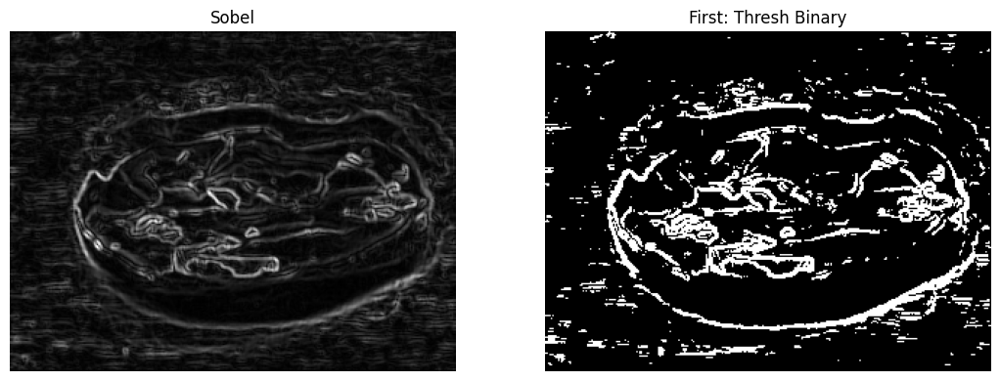

In [ ]:
# sobel di segmentasi dengan otsu

th = 0
max_val = 255

# Thresh binary
th_val, image_th = cv2.threshold(edge,th,max_val,cv2.THRESH_BINARY + cv2.THRESH_OTSU)

# create figure
fig = plt.figure(figsize=(20, 10))

# showing image
fig.add_subplot(rows, columns, 1)
plt.imshow(edge,'gray')
plt.axis('off')
plt.title("Sobel")

fig.add_subplot(rows, columns, 2)
plt.imshow(image_th,'gray')
plt.axis('off')
plt.title("First: Thresh Binary")

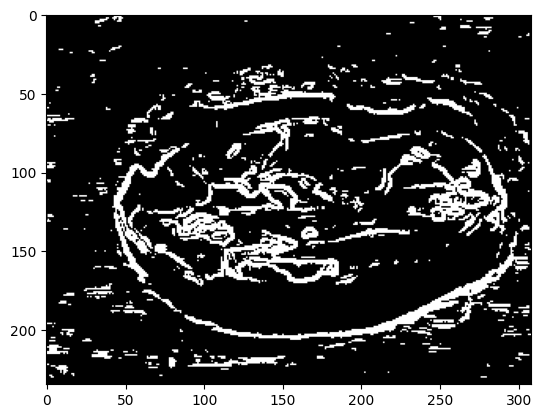

In [ ]:
plt.imshow(image_th,'gray')

Text(0.5, 1.0, 'After Cleaning')

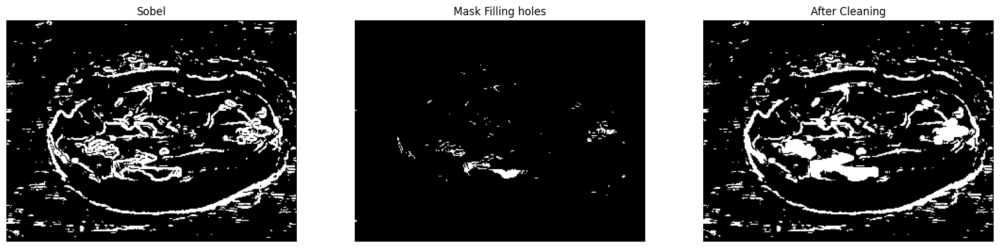

In [ ]:
# Cleaning
im_floodfill2 = image_th.copy()
h, w = image_th.shape[:2]
mask = np.zeros((h+2, w+2), np.uint8)
cv2.floodFill(im_floodfill2, mask, (0,0), 255);
im_floodfill_inv2 = cv2.bitwise_not(im_floodfill2)
im_out2 = image_th | im_floodfill_inv2
kernel = np.ones((4,4), np.uint8)

# create figure
fig = plt.figure(figsize=(20, 10))
rows = 1
columns = 3

# showing image
fig.add_subplot(rows, columns, 1)
plt.imshow(image_th,'gray')
plt.axis('off')
plt.title("Sobel")

fig.add_subplot(rows, columns, 2)
plt.imshow(im_floodfill_inv2,'gray')
plt.axis('off')
plt.title("Mask Filling holes")

fig.add_subplot(rows, columns, 3)
plt.imshow(im_out2,'gray')
plt.axis('off')
plt.title("After Cleaning")

Text(0.5, 1.0, 'Closing (Kernel Dimensi 10 x 10)')

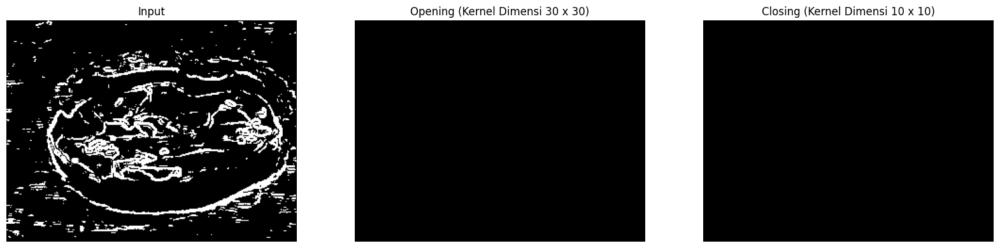

In [ ]:
# opening
kernel_elipse = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (30, 30))
kernel = np.ones((8, 8), np.uint8)
opening = cv2.morphologyEx(image_th, cv2.MORPH_OPEN, kernel_elipse)

kernel_elipse = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (10, 10))
kernel = np.ones((8, 8), np.uint8)
closing = cv2.morphologyEx(opening, cv2.MORPH_CLOSE, kernel_elipse)

# create figure
fig = plt.figure(figsize=(20, 10))

# showing image
fig.add_subplot(rows, columns, 1)
plt.imshow(image_th,'gray')
plt.axis('off')
plt.title("Input")

fig.add_subplot(rows, columns, 2)
plt.imshow(opening,'gray')
plt.axis('off')
plt.title("Opening (Kernel Dimensi 30 x 30)")

fig.add_subplot(rows, columns, 3)
plt.imshow(closing,'gray')
plt.axis('off')
plt.title("Closing (Kernel Dimensi 10 x 10)")

Text(0.5, 1.0, 'Dilation')

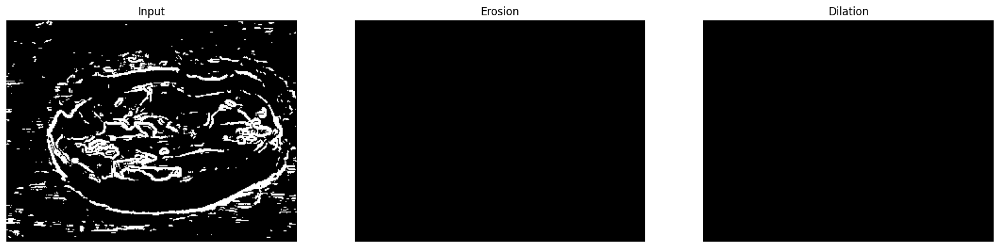

In [ ]:
kernel1 = np.ones((6,6), np.uint8)
kernel2 = np.ones((5,5), np.uint8)
img_erosion2 = cv2.erode(image_th, kernel1, iterations=2)
img_dilation2 = cv2.dilate(img_erosion2, kernel2, iterations=2)

# create figure
fig = plt.figure(figsize=(20, 10))
rows = 1
columns = 3

# Adds a subplot at the 1st position
fig.add_subplot(rows, columns, 1)
plt.imshow(image_th,'gray')
plt.axis('off')
plt.title("Input")

fig.add_subplot(rows, columns, 2)
plt.imshow(img_erosion2,'gray')
plt.axis('off')
plt.title("Erosion")

fig.add_subplot(rows, columns, 3)
plt.imshow(img_dilation2,'gray')
plt.axis('off')
plt.title("Dilation")